In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

Matplotlib is building the font cache; this may take a moment.


In [2]:
import warnings
warnings.filterwarnings('ignore')

# Loading Data

In [3]:
data=pd.read_csv("S:\\GUVI\\PROJECTS\\Home LLC\\DATA.csv")

In [4]:
data.head()

,DATE,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA
0,01-05-2022,3.6,106.4,352.857,123.322800,8.581511,5.2300,NaN,4.13,8.4,NaN,74737,19699.465,-0.144227,120.724
1,01-04-2022,3.6,107.3,343.730,121.978170,8.258629,4.9825,NaN,3.76,8.4,NaN,74737,19699.465,-0.144227,121.813
2,01-03-2022,3.6,107.2,345.852,121.301004,8.542456,4.1720,NaN,3.43,7.0,NaN,73289,19727.918,-0.395692,122.888
3,01-02-2022,3.8,110.5,343.583,119.702806,7.871064,3.7625,NaN,3.25,6.0,NaN,73289,19727.918,-0.395692,123.831
4,01-01-2022,4.0,113.8,345.742,118.619339,7.479872,3.4450,NaN,2.93,5.7,NaN,73289,19727.918,-0.395692,124.780


In [5]:
data.shape

(241, 15)

# Exploratory Data Analysis

In [6]:
#Statistical Summary of data
data.describe()

,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA
count,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,224.000000,241.000000,241.000000,236.000000,241.000000,241.000000,241.000000,241.000000
mean,6.074689,90.809544,206.949863,95.539665,2.296497,4.697956,53273.982143,4.471162,5.974274,66.410104,52896.082988,16536.012095,0.490060,175.306996
std,1.987058,25.871004,40.479900,11.087025,1.641645,1.119850,7475.321506,1.079004,1.895763,0.802918,8840.592318,1708.435162,1.453910,36.780758
min,3.500000,25.000000,143.800000,75.859538,-2.097161,2.684000,42409.000000,2.140000,3.300000,64.924129,37860.000000,13477.356000,-8.937251,120.724000
25%,4.700000,70.400000,183.300000,87.722400,1.463784,3.802500,49007.250000,3.690000,4.600000,65.623251,46977.000000,15304.517000,0.293599,147.395000
50%,5.600000,94.500000,206.200000,96.819215,2.070508,4.457500,50303.000000,4.340000,5.500000,66.739214,51554.000000,16253.726000,0.580001,169.812000
75%,7.300000,108.200000,221.700000,103.255463,2.969762,5.812500,59039.000000,5.410000,6.700000,67.128435,58745.000000,17896.623000,0.833911,189.707000
max,14.700000,138.400000,352.857000,123.322800,8.581511,6.806000,68703.000000,6.750000,12.200000,67.298433,74737.000000,19806.290000,7.547535,304.831000


In [7]:
#Datatypes of data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   DATE                           241 non-null    object 
 1   UNRATE(%)                      241 non-null    float64
 2   CONSUMER CONF INDEX            241 non-null    float64
 3   PPI-CONST MAT.                 241 non-null    float64
 4   CPIALLITEMS                    241 non-null    float64
 5   INFLATION(%)                   241 non-null    float64
 6   MORTGAGE INT. MONTHLY AVG(%)   241 non-null    float64
 7   MED HOUSEHOLD INCOME           224 non-null    float64
 8   CORP. BOND YIELD(%)            241 non-null    float64
 9   MONTHLY HOME SUPPLY            241 non-null    float64
 10  % SHARE OF WORKING POPULATION  236 non-null    float64
 11  GDP PER CAPITA                 241 non-null    int64  
 12  QUARTERLY REAL GDP             241 non-null    flo

In [8]:
data.isnull().sum()

DATE                              0
UNRATE(%)                         0
CONSUMER CONF INDEX               0
PPI-CONST MAT.                    0
CPIALLITEMS                       0
INFLATION(%)                      0
MORTGAGE INT. MONTHLY AVG(%)      0
MED HOUSEHOLD INCOME             17
CORP. BOND YIELD(%)               0
MONTHLY HOME SUPPLY               0
% SHARE OF WORKING POPULATION     5
GDP PER CAPITA                    0
QUARTERLY REAL GDP                0
QUARTERLY GDP GROWTH RATE (%)     0
CSUSHPISA                         0
dtype: int64

# Making new features for Month and Year from Date

In [9]:
data['DATE']=pd.to_datetime(data['DATE'])

In [10]:
data['DATE'].dtype

dtype('<M8[ns]')

In [11]:
data['MONTH']=data['DATE'].dt.day
data['YEAR']=data['DATE'].dt.year

In [12]:
data['MONTH'].value_counts()

5     21
4     20
3     20
2     20
1     20
12    20
11    20
10    20
9     20
8     20
7     20
6     20
Name: MONTH, dtype: int64

In [13]:
data1=data.drop(['DATE'],axis=1)

In [14]:
data1.columns

Index(['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS',
       'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME',
       'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY',
       '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP',
       'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA', 'MONTH', 'YEAR'],
      dtype='object')

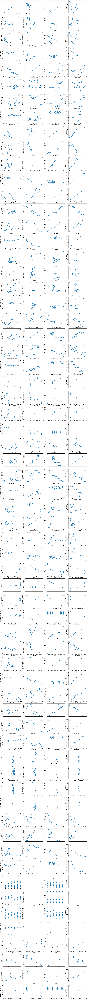

In [15]:
columns=data1.columns
k=1
plt.figure(figsize=(25,300))
for i in columns:
    for j in columns:
        plt.subplot(64,4,k)
        sns.scatterplot(data=data1,x=i,y=j,size=5)
        k+=1

Following points were observed as anticipated.
- Median Household income and Consumer confidence index decrease with increased unemployment.
- Unemployment was high in the period of recession and pandemic.
- Consumer Price Index, Producers Purchase Index- Construction Material, Median household income and Gross Domestic Product have increased over the years.
- Mortgae interest rate and Corporate bond yield has decreased over the years.
- Housing Price Index has decreased with increase in Consumer Price Index, Producers Purchase Index-Construction Material and   Gross Domestic Product.

# Visualizing Distribution plot of all variables

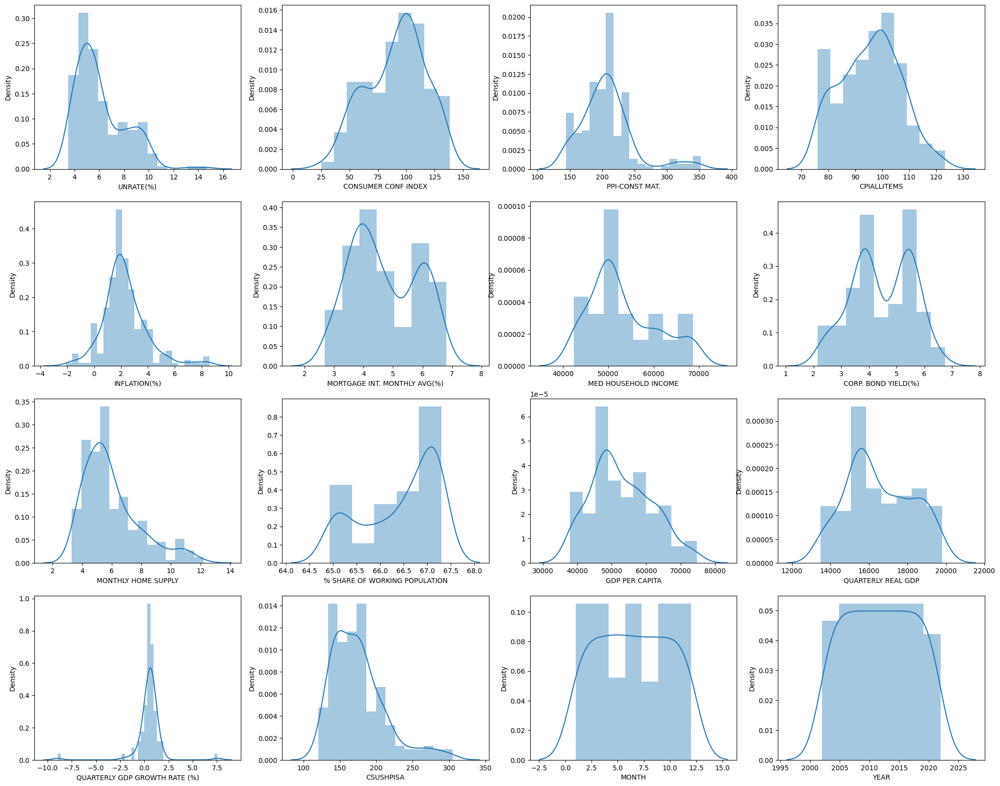

In [16]:
k=1
plt.figure(figsize=(25,20))
for i in columns:
    plt.subplot(4,4,k)
    sns.distplot(data1[i])
    k+=1

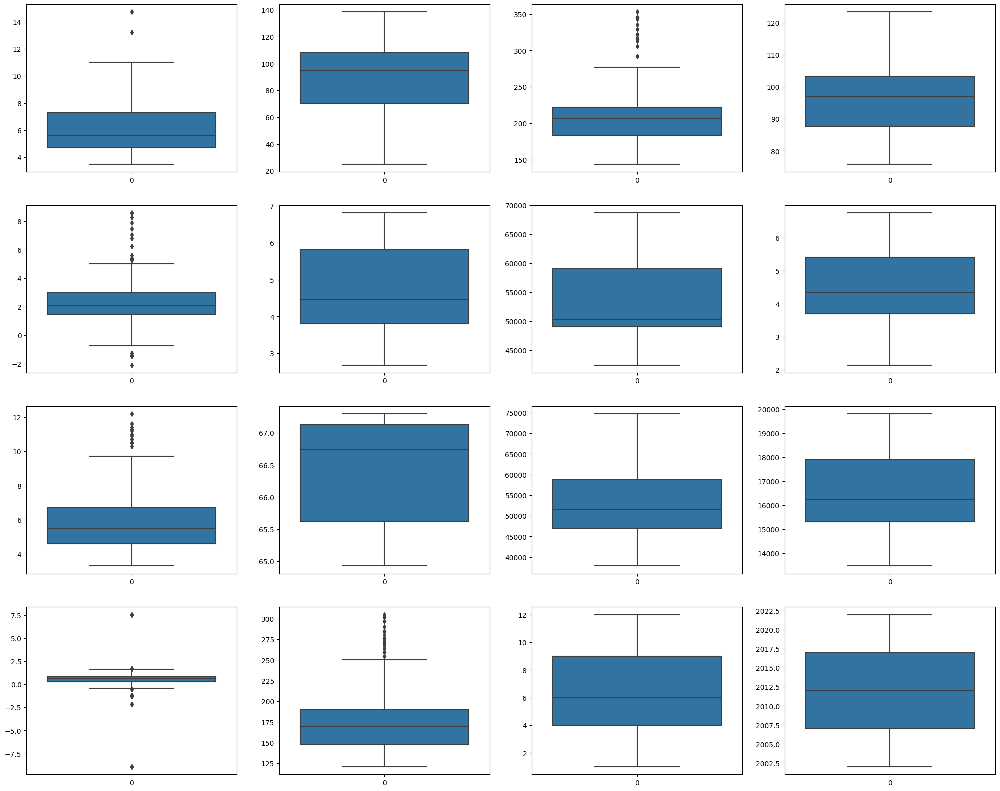

In [17]:
k=1
plt.figure(figsize=(25,20))
for i in columns:
    plt.subplot(4,4,k)
    sns.boxplot(data1[i])
    k+=1

# Correlation of Data

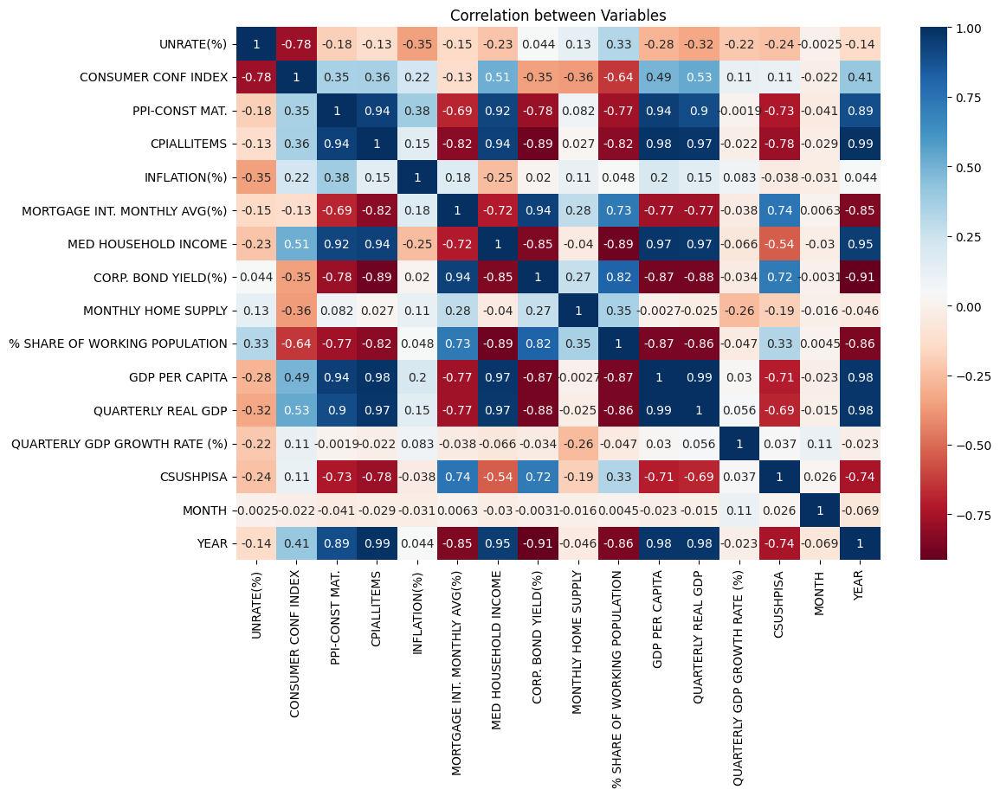

In [18]:
plt.figure(figsize=(12, 8))
sns.heatmap(data1.corr(),cmap='RdBu', annot = True)
plt.title("Correlation between Variables")
plt.show()

# Imputing missing values in % Working Population and Median Income by KNN Imputer

In [19]:
# Imputing with KNNImputer

from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler

#Defining a subset of the dataset
df_knn = data1.filter(['YEAR','GDP PER CAPITA','CORP. BOND YIELD(%)','CPIALLITEMS','MED HOUSEHOLD INCOME','% SHARE OF WORKING POPULATION'], axis=1).copy()

# Define scaler to set values between 0 and 1

# Define KNN imputer and fill missing values
knn_imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
df_knn_imputed = pd.DataFrame(knn_imputer.fit_transform(df_knn), columns=df_knn.columns)

In [20]:
data1['MED HOUSEHOLD INCOME']=df_knn_imputed['MED HOUSEHOLD INCOME']

In [21]:
data1['% SHARE OF WORKING POPULATION']=df_knn_imputed['% SHARE OF WORKING POPULATION']

In [22]:
data1.isnull().sum()

UNRATE(%)                        0
CONSUMER CONF INDEX              0
PPI-CONST MAT.                   0
CPIALLITEMS                      0
INFLATION(%)                     0
MORTGAGE INT. MONTHLY AVG(%)     0
MED HOUSEHOLD INCOME             0
CORP. BOND YIELD(%)              0
MONTHLY HOME SUPPLY              0
% SHARE OF WORKING POPULATION    0
GDP PER CAPITA                   0
QUARTERLY REAL GDP               0
QUARTERLY GDP GROWTH RATE (%)    0
CSUSHPISA                        0
MONTH                            0
YEAR                             0
dtype: int64

In [23]:
data1.head()

,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,MONTH,YEAR
0,3.6,106.4,352.857,123.322800,8.581511,5.2300,68703.0,4.13,8.4,64.924129,74737,19699.465,-0.144227,120.724,5,2022
1,3.6,107.3,343.730,121.978170,8.258629,4.9825,68703.0,3.76,8.4,64.924129,74737,19699.465,-0.144227,121.813,4,2022
2,3.6,107.2,345.852,121.301004,8.542456,4.1720,68703.0,3.43,7.0,64.924129,73289,19727.918,-0.395692,122.888,3,2022
3,3.8,110.5,343.583,119.702806,7.871064,3.7625,68703.0,3.25,6.0,64.924129,73289,19727.918,-0.395692,123.831,2,2022
4,4.0,113.8,345.742,118.619339,7.479872,3.4450,68703.0,2.93,5.7,64.924129,73289,19727.918,-0.395692,124.780,1,2022


# Splitting the Data into Training and Testing Sets

In [24]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
#np.random.seed(0)
data1_train, data1_test = train_test_split(data1, train_size = 0.7, random_state = 100)

# Rescaling the features

In [25]:
from sklearn.preprocessing import MinMaxScaler

In [26]:
scaler = MinMaxScaler()
#Fit on data
data1_train= pd.DataFrame(scaler.fit_transform(data1_train),columns=data1.columns)
data1_train.head()

,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,MONTH,YEAR
0,0.257732,0.458554,0.027744,0.046224,0.346472,0.792819,0.034571,0.766667,0.056180,0.764470,0.067847,0.103339,0.612158,0.624506,0.818182,0.05
1,0.195876,0.598765,0.103799,0.099559,0.494571,0.738962,0.073211,0.726667,0.112360,0.841314,0.127478,0.178267,0.604150,0.498199,0.909091,0.10
2,0.226804,0.686949,0.344404,0.479190,0.133632,0.239204,0.536510,0.268889,0.168539,0.501094,0.492394,0.600937,0.591489,0.148278,0.000000,0.65
3,0.113402,0.702822,0.176507,0.205341,0.574078,0.969918,0.220278,0.808889,0.337079,0.985051,0.223147,0.285067,0.557049,0.435356,0.454545,0.20
4,0.134021,0.721340,0.162157,0.168006,0.502011,0.865721,0.220278,0.688889,0.314607,0.985051,0.211921,0.279152,0.623964,0.451145,0.090909,0.20


In [27]:
#Divide the data into X and y
y_train = data1_train.pop('CSUSHPISA')
X_train = data1_train

# Recursive Feature Elimination

In [29]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [30]:
# Running RFE with the output number of the variable equal to 15
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=10)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [31]:
#List of variables selected
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('UNRATE(%)', False, 3),
 ('CONSUMER CONF INDEX', True, 1),
 ('PPI-CONST MAT.', True, 1),
 ('CPIALLITEMS', True, 1),
 ('INFLATION(%)', True, 1),
 ('MORTGAGE INT. MONTHLY AVG(%)', False, 5),
 ('MED HOUSEHOLD INCOME', False, 6),
 ('CORP. BOND YIELD(%)', True, 1),
 ('MONTHLY HOME SUPPLY', True, 1),
 ('% SHARE OF WORKING POPULATION', True, 1),
 ('GDP PER CAPITA', True, 1),
 ('QUARTERLY REAL GDP', False, 2),
 ('QUARTERLY GDP GROWTH RATE (%)', True, 1),
 ('MONTH', False, 4),
 ('YEAR', True, 1)]

In [32]:
#Columns where RFE support is True
col = X_train.columns[rfe.support_]
col

Index(['CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)',
       'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY',
       '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA',
       'QUARTERLY GDP GROWTH RATE (%)', 'YEAR'],
      dtype='object')

In [33]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

# Building model using statsmodel, for the detailed statistics

In [35]:
pip install statsmodels


     ---------------------------------------- 0.0/9.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/9.2 MB ? eta -:--:--
     ---------------------------------------- 0.1/9.2 MB 1.1 MB/s eta 0:00:09
      --------------------------------------- 0.1/9.2 MB 853.3 kB/s eta 0:00:11
      --------------------------------------- 0.2/9.2 MB 1.3 MB/s eta 0:00:08
     - -------------------------------------- 0.5/9.2 MB 1.8 MB/s eta 0:00:05
     -- ------------------------------------- 0.7/9.2 MB 2.1 MB/s eta 0:00:04
     ---- ----------------------------------- 1.0/9.2 MB 2.8 MB/s eta 0:00:03
     ----- ---------------------------------- 1.4/9.2 MB 3.3 MB/s eta 0:00:03
     ------- -------------------------------- 1.6/9.2 MB 3.6 MB/s eta 0:00:03
     -------- ------------------------------- 1.9/9.2 MB 3.9 MB/s eta 0:00:02
     --------- ------------------------------ 2.2/9.2 MB 4.1 MB/s eta 0:00:02
     ---------- ----------------------------- 2.5/9.2 MB 4.1 MB/s eta 0:00:


[notice] A new release of pip is available: 23.0.1 -> 23.2.1
[notice] To update, run: C:\Users\siddharth\AppData\Local\Programs\Python\Python311\python.exe -m pip install --upgrade pip


In [36]:
import statsmodels.api as sm

In [37]:
X_train_rfe = sm.add_constant(X_train_rfe)

In [38]:
# Running the linear model 
lm = sm.OLS(y_train,X_train_rfe).fit()

In [39]:
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              CSUSHPISA   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.953
Method:                 Least Squares   F-statistic:                     341.1
Date:                Thu, 07 Sep 2023   Prob (F-statistic):          4.87e-101
Time:                        11:06:32   Log-Likelihood:                 291.12
No. Observations:                 168   AIC:                            -560.2
Df Residuals:                     157   BIC:                            -525.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

Checking VIF 
Variance Inflation Factor or VIF, gives a basic quantitative idea about how much the feature variables are correlated with each other. It is an extremely important parameter to test our linear model.

In [40]:
#Dropping constant
X_train_rfe = X_train_rfe.drop(['const'], axis=1)

In [41]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_rfe
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,CPIALLITEMS,971.12
7,GDP PER CAPITA,891.96
9,YEAR,554.54
1,PPI-CONST MAT.,103.59
8,QUARTERLY GDP GROWTH RATE (%),63.68
0,CONSUMER CONF INDEX,46.91
4,CORP. BOND YIELD(%),40.77
6,% SHARE OF WORKING POPULATION,34.44
3,INFLATION(%),21.50
5,MONTHLY HOME SUPPLY,11.69


# Now lets drop the variable having high p value. We can see CPIALLITEMS has high p value

In [42]:
#Drop MED HOUSEHOLD INCOME
X_train_new1 = X_train_rfe.drop(["CPIALLITEMS"], axis = 1)

# Rebuilding the model

In [43]:
#Build a model
X_train_lm1 = sm.add_constant(X_train_new1)
lm1 = sm.OLS(y_train,X_train_lm1).fit()
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:              CSUSHPISA   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.953
Method:                 Least Squares   F-statistic:                     379.0
Date:                Thu, 07 Sep 2023   Prob (F-statistic):          3.91e-102
Time:                        11:07:15   Log-Likelihood:                 290.61
No. Observations:                 168   AIC:                            -561.2
Df Residuals:                     158   BIC:                            -530.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [44]:
#Drop the constant term B0
X_train_lm1 = X_train_lm1.drop(['const'], axis=1)

In [45]:
# Calculate the VIFs for the new model
vif = pd.DataFrame()
X = X_train_lm1
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,GDP PER CAPITA,697.56
8,YEAR,256.58
1,PPI-CONST MAT.,97.24
7,QUARTERLY GDP GROWTH RATE (%),59.44
3,CORP. BOND YIELD(%),40.54
0,CONSUMER CONF INDEX,35.38
5,% SHARE OF WORKING POPULATION,27.07
2,INFLATION(%),20.16
4,MONTHLY HOME SUPPLY,11.33


# Lets drop GDP PER CAPITA due to its p value

In [46]:
X_train_new2 = X_train_lm1.drop(['GDP PER CAPITA'], axis=1)

In [47]:
#Build a model
X_train_lm2 = sm.add_constant(X_train_new2)
lm2 = sm.OLS(y_train,X_train_lm2).fit()
print(lm2.summary())

                            OLS Regression Results                            
Dep. Variable:              CSUSHPISA   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.947
Method:                 Least Squares   F-statistic:                     377.3
Date:                Thu, 07 Sep 2023   Prob (F-statistic):           3.08e-99
Time:                        11:07:52   Log-Likelihood:                 280.31
No. Observations:                 168   AIC:                            -542.6
Df Residuals:                     159   BIC:                            -514.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [48]:
#Drop the constant term B0
X_train_lm2 = X_train_lm2.drop(['const'], axis=1)

In [49]:
# Calculate the VIFs for the new model
vif = pd.DataFrame()
X = X_train_lm2
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,QUARTERLY GDP GROWTH RATE (%),53.53
7,YEAR,52.56
1,PPI-CONST MAT.,51.75
3,CORP. BOND YIELD(%),31.38
5,% SHARE OF WORKING POPULATION,23.99
2,INFLATION(%),19.19
0,CONSUMER CONF INDEX,17.11
4,MONTHLY HOME SUPPLY,6.91


# Lets drop QUARTERLY GDP GROWTH RATE (%) due to high p value

In [50]:
X_train_new3 = X_train_lm2.drop(['QUARTERLY GDP GROWTH RATE (%)'], axis=1)

In [51]:
#Build a model
X_train_lm3 = sm.add_constant(X_train_new3)
lm3 = sm.OLS(y_train,X_train_lm3).fit()
print(lm3.summary())

                            OLS Regression Results                            
Dep. Variable:              CSUSHPISA   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.948
Method:                 Least Squares   F-statistic:                     433.2
Date:                Thu, 07 Sep 2023   Prob (F-statistic):          1.60e-100
Time:                        11:08:23   Log-Likelihood:                 280.18
No. Observations:                 168   AIC:                            -544.4
Df Residuals:                     160   BIC:                            -519.4
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [52]:
#Drop the constant term B0
X_train_lm3 = X_train_lm3.drop(['const'], axis=1)

In [53]:
# Calculate the VIFs for the new model
vif = pd.DataFrame()
X = X_train_lm3
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,PPI-CONST MAT.,51.68
6,YEAR,41.48
3,CORP. BOND YIELD(%),26.71
2,INFLATION(%),19.07
5,% SHARE OF WORKING POPULATION,17.93
0,CONSUMER CONF INDEX,16.40
4,MONTHLY HOME SUPPLY,5.27


# Dropping PPI-CONST MAT. due to high VIF value

In [54]:
X_train_new4 = X_train_lm3.drop(['PPI-CONST MAT.'], axis=1)

In [55]:
#Build a model
X_train_lm4 = sm.add_constant(X_train_new4)
lm4 = sm.OLS(y_train,X_train_lm4).fit()
print(lm4.summary())


                            OLS Regression Results                            
Dep. Variable:              CSUSHPISA   R-squared:                       0.927
Model:                            OLS   Adj. R-squared:                  0.924
Method:                 Least Squares   F-statistic:                     338.9
Date:                Thu, 07 Sep 2023   Prob (F-statistic):           1.37e-88
Time:                        11:08:59   Log-Likelihood:                 248.17
No. Observations:                 168   AIC:                            -482.3
Df Residuals:                     161   BIC:                            -460.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [56]:
#Drop the constant term B0
X_train_lm4 = X_train_lm4.drop(['const'], axis=1)

In [57]:
# Calculate the VIFs for the new model
vif = pd.DataFrame()
X = X_train_lm4
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif


,Features,VIF
2,CORP. BOND YIELD(%),26.66
4,% SHARE OF WORKING POPULATION,15.83
0,CONSUMER CONF INDEX,14.70
5,YEAR,9.23
1,INFLATION(%),6.70
3,MONTHLY HOME SUPPLY,4.80


# Dropping CORP. BOND YIELD(%) due to high VIF value

In [58]:
X_train_new5 = X_train_lm4.drop(['CORP. BOND YIELD(%)'], axis=1)

In [59]:
#Build a model
X_train_lm5 = sm.add_constant(X_train_new5)
lm5 = sm.OLS(y_train,X_train_lm5).fit()
print(lm5.summary())


                            OLS Regression Results                            
Dep. Variable:              CSUSHPISA   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.918
Method:                 Least Squares   F-statistic:                     374.1
Date:                Thu, 07 Sep 2023   Prob (F-statistic):           5.23e-87
Time:                        11:11:13   Log-Likelihood:                 241.21
No. Observations:                 168   AIC:                            -470.4
Df Residuals:                     162   BIC:                            -451.7
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

# Residual Analysis of the train data

In [60]:
#Drop the constant term B0
X_train_lm5 = X_train_lm5.drop(['const'], axis=1)

In [61]:
# Calculate the VIFs for the new model
vif = pd.DataFrame()
X = X_train_lm5
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,CONSUMER CONF INDEX,8.91
1,INFLATION(%),6.58
4,YEAR,6.41
3,% SHARE OF WORKING POPULATION,4.53
2,MONTHLY HOME SUPPLY,4.39


In [62]:
X_train_lm5=sm.add_constant(X_train_lm5)
X_train_lm5.head()

,const,CONSUMER CONF INDEX,INFLATION(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,YEAR
0,1.0,0.458554,0.346472,0.056180,0.764470,0.05
1,1.0,0.598765,0.494571,0.112360,0.841314,0.10
2,1.0,0.686949,0.133632,0.168539,0.501094,0.65
3,1.0,0.702822,0.574078,0.337079,0.985051,0.20
4,1.0,0.721340,0.502011,0.314607,0.985051,0.20


In [63]:
#y train predicted
y_train_pred = lm5.predict(X_train_lm5)

In [64]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

<Figure size 640x480 with 0 Axes>

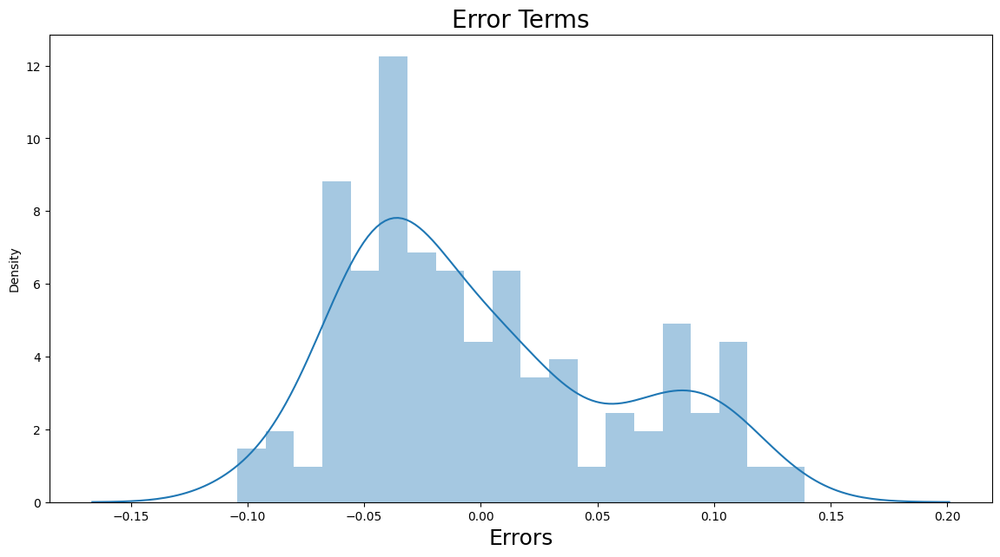

In [65]:
# Plot the histogram of the error terms

fig = plt.figure()
plt.figure(figsize=(14,7))
sns.distplot((y_train - y_train_pred), bins = 20)
plt.title('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  # X-label
plt.show()

# Making Predictions

In [66]:
#Fit on data
data1_test= pd.DataFrame(scaler.transform(data1_test),columns=data1.columns)
data1_test.head()

,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,MONTH,YEAR
0,0.432990,0.393298,0.312355,0.465492,0.340188,0.205847,0.425040,0.366667,0.089888,0.685038,0.399463,0.468346,0.594793,0.100930,0.090909,0.55
1,0.659794,0.216049,0.217166,0.324723,0.326237,0.531538,0.280216,0.653333,0.483146,0.946228,0.262087,0.300493,0.606936,0.253195,0.909091,0.35
2,0.103093,0.663139,0.188944,0.205341,0.348626,0.902111,0.220278,0.724444,0.382022,0.985051,0.230523,0.288700,0.551278,0.420826,0.727273,0.20
3,0.567010,0.338624,0.267391,0.388165,0.410498,0.522077,0.290751,0.640000,0.438202,0.914174,0.310275,0.362234,0.527537,0.189466,0.181818,0.45
4,0.154639,0.716049,0.111931,0.138672,0.459087,0.730471,0.148969,0.624444,0.101124,0.924423,0.175990,0.233678,0.589809,0.469716,0.545455,0.15


In [67]:
#Dividing into X_test and y_test
y_test = data1_test.pop('CSUSHPISA')
X_test = data1_test
X_test.describe()

,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),MONTH,YEAR
count,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000
mean,0.288236,0.562671,0.292952,0.412130,0.358058,0.477995,0.459198,0.482344,0.304602,0.612964,0.402592,0.479750,0.562383,0.489415,0.495205
std,0.232648,0.244737,0.164179,0.221807,0.154602,0.264576,0.312054,0.240348,0.228821,0.350004,0.226459,0.261690,0.114872,0.326244,0.287852
min,0.000000,0.114638,0.005740,0.008000,-0.066983,0.030568,0.000000,-0.024444,0.011236,0.000000,0.006481,0.008593,0.000000,0.000000,0.000000
25%,0.123711,0.328924,0.209512,0.270481,0.289827,0.251334,0.261162,0.320000,0.134831,0.294454,0.247227,0.288700,0.559962,0.181818,0.300000
50%,0.206186,0.612875,0.295135,0.425464,0.344980,0.403202,0.327375,0.431111,0.235955,0.764470,0.361879,0.427025,0.576603,0.545455,0.500000
75%,0.474227,0.723104,0.373582,0.579176,0.437267,0.737142,0.712216,0.691111,0.382022,0.928401,0.566342,0.698264,0.594793,0.818182,0.750000
max,1.154639,0.976190,0.955639,0.923731,0.929014,0.931587,1.000000,0.915556,0.932584,1.000000,0.960734,0.987617,1.000000,1.000000,1.000000


In [68]:
X_train_new5.columns

Index(['CONSUMER CONF INDEX', 'INFLATION(%)', 'MONTHLY HOME SUPPLY',
       '% SHARE OF WORKING POPULATION', 'YEAR'],
      dtype='object')

In [69]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_new5.columns]

# Adding a constant variable 
X_test_new1 = sm.add_constant(X_test_new)
X_test_new1.head()

,const,CONSUMER CONF INDEX,INFLATION(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,YEAR
0,1.0,0.393298,0.340188,0.089888,0.685038,0.55
1,1.0,0.216049,0.326237,0.483146,0.946228,0.35
2,1.0,0.663139,0.348626,0.382022,0.985051,0.20
3,1.0,0.338624,0.410498,0.438202,0.914174,0.45
4,1.0,0.716049,0.459087,0.101124,0.924423,0.15


In [70]:
# Making predictions
y_pred = lm5.predict(X_test_new1)


# Finding R-squared and Adjusted R-Squared for Test set

In [71]:
#Evaluate R-square for test
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.9115191165710965

In [72]:
#Adjusted R^2
#adj r2=1-(1-R2)*(n-1)/(n-p-1)

#n =sample size , p = number of independent variables
n = X_test.shape[0]
p = X_test.shape[1]


Adj_r2=1-(1-0.75783003115855)*(n-1)/(n-p-1)
print(Adj_r2)

0.6941010919897472


# Making Predictions using different Regression Models

In [73]:
data2=data1[['CONSUMER CONF INDEX','YEAR','INFLATION(%)','MONTHLY HOME SUPPLY','% SHARE OF WORKING POPULATION','CSUSHPISA']]

In [74]:
data2['CSUSHPISA']=np.log(data2['CSUSHPISA'])


<Axes: xlabel='CSUSHPISA', ylabel='Density'>

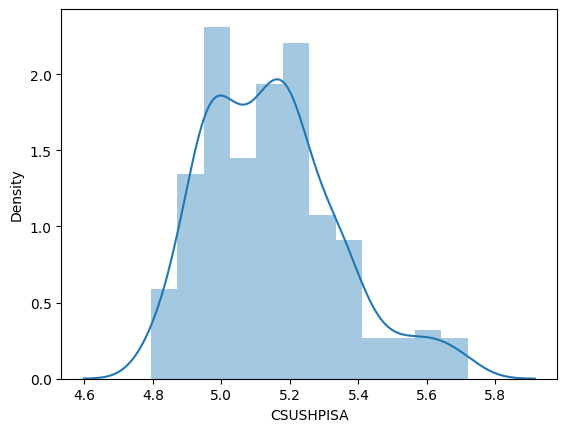

In [75]:
sns.distplot(data2['CSUSHPISA'])

In [76]:
Y=data2['CSUSHPISA']
X=data2.drop(columns=['CSUSHPISA'])

In [77]:
X_train,X_test,Y_train,Y_test=train_test_split(X, Y, test_size=0.2, random_state=2)

# Linear Regression Model

In [78]:
from sklearn.linear_model import LinearRegression

In [79]:
Lin_reg = LinearRegression()
Lin_reg.fit(X_train,Y_train)
print(Lin_reg.intercept_)
print(Lin_reg.coef_)
print('R2 Train Data',Lin_reg.score(X_train,Y_train))
print('R2 Test Data',Lin_reg.score(X_test,Y_test))

137.1600121514309
[ 0.00208632 -0.05780962 -0.02076199  0.02286314 -0.24081475]
R2 Train Data 0.9068870437846339
R2 Test Data 0.8957219590667898


# Random Forest Regressor

In [81]:
from sklearn.ensemble import RandomForestRegressor as rfr
from sklearn import metrics

Rfr = rfr(n_estimators=200, criterion='squared_error',
          random_state=1, n_jobs=-1)

Rfr.fit(X_train, Y_train)
X_train_pred = Rfr.predict(X_train)
X_test_pred = Rfr.predict(X_test)

print('MSE train data: %.3f, MSE test data: %.3f' %
      (metrics.mean_squared_error(X_train_pred, Y_train),
       metrics.mean_squared_error(X_test_pred, Y_test)))
print('R2 train data: %.3f, R2 test data: %.3f' %
      (metrics.r2_score(X_train_pred, Y_train),
       metrics.r2_score(X_test_pred, Y_test)))

MSE train data: 0.000, MSE test data: 0.000
R2 train data: 0.998, R2 test data: 0.985


# XGBoost Regressor

In [82]:
import xgboost
regressor=xgboost.XGBRegressor()

In [83]:
regressor=xgboost.XGBRegressor()
regressor.fit(X_train,Y_train)
Y_train_pred=regressor.predict(X_train)
Y_test_pred=regressor.predict(X_test)
print('R2 train data: %.3f, R2 test data: %.3f' % 
      (metrics.r2_score(Y_train_pred, Y_train),
       metrics.r2_score(Y_test_pred, Y_test)))


R2 train data: 1.000, R2 test data: 0.974


In [84]:
Y_pred=regressor.predict(X)

In [85]:
Y_pred=np.exp(Y_pred)


In [86]:
Y_pred[0:5]

array([120.66951 , 121.808044, 122.934105, 123.96475 , 124.81114 ],
      dtype=float32)

# RandomForest Regression and XGBoost Regression both give equivalent regression accuracy. Hence both models can be used for forecasting.